## 硬币检测，Canny+Hough实现

In [1]:
%matplotlib inline 
import cv2
import matplotlib.pyplot as plt
import numpy as np
from methods import canny, show_img, hough_circle
import logging


# canny 在这步找到canny的最佳参数，传递给hough
# img = cv2.imread("./img/coins3.jpg", cv2.IMREAD_GRAYSCALE)
# edge, direction = canny(img, high_threshold=100, low_threshold=50)

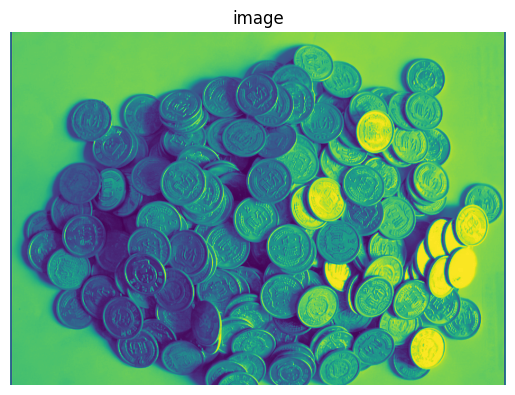

image shape:(799, 1122)


nms calculating: 100%|██████████| 797/797 [00:05<00:00, 151.80it/s]


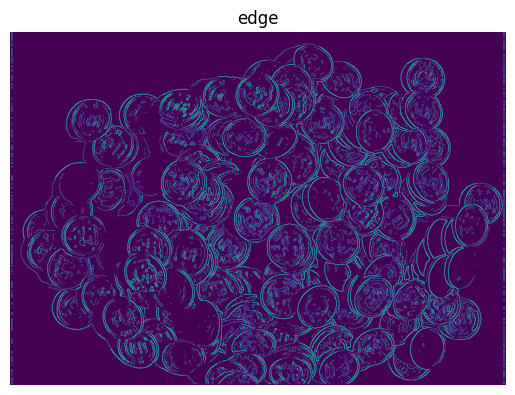

voting: 100%|██████████| 35284/35284 [00:08<00:00, 4052.99it/s]


voting threshold:5


filter circle: 14308it [00:01, 7251.31it/s]


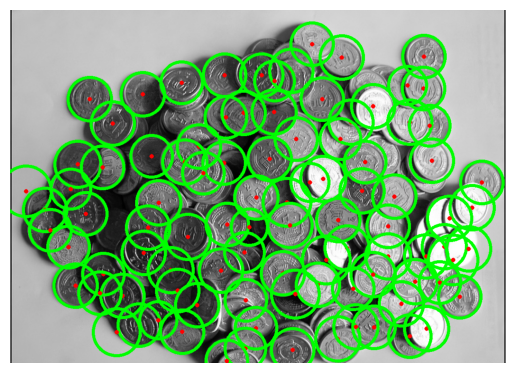

Above circles: min_r41,max_r57
----------------------------------------------------------------------------------------------------
voting threshold:6


filter circle: 9357it [00:01, 7910.98it/s]


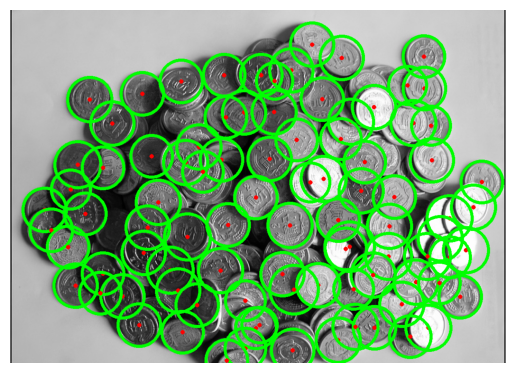

Above circles: min_r40,max_r56
----------------------------------------------------------------------------------------------------
voting threshold:7


filter circle: 6257it [00:00, 8202.70it/s]


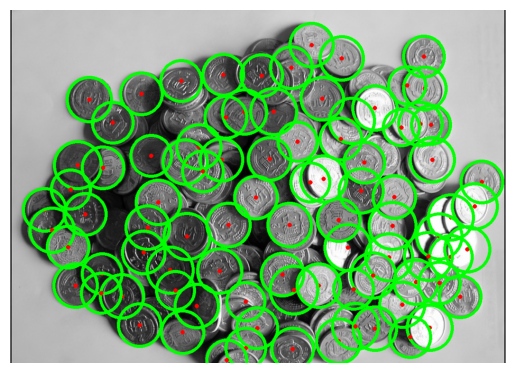

Above circles: min_r41,max_r54
----------------------------------------------------------------------------------------------------
voting threshold:8


filter circle: 4203it [00:00, 8602.57it/s]


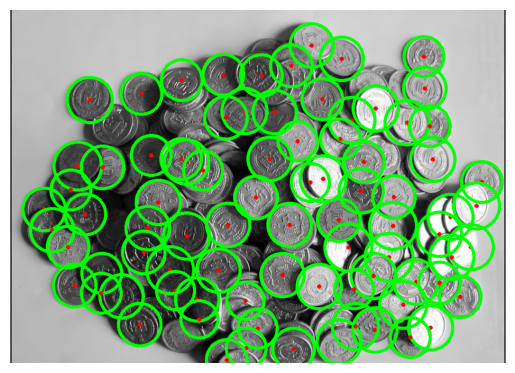

Above circles: min_r42,max_r54
----------------------------------------------------------------------------------------------------
voting threshold:9


filter circle: 2921it [00:00, 9041.15it/s]


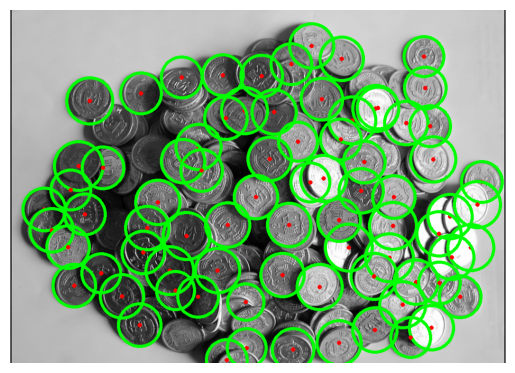

Above circles: min_r41,max_r55
----------------------------------------------------------------------------------------------------
voting threshold:10


filter circle: 2024it [00:00, 8744.25it/s]


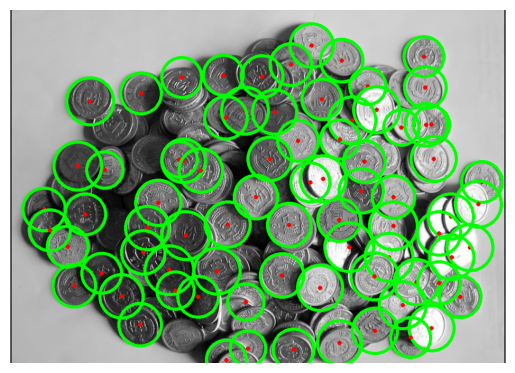

Above circles: min_r40,max_r55
----------------------------------------------------------------------------------------------------
voting threshold:11


filter circle: 1378it [00:00, 9955.36it/s]


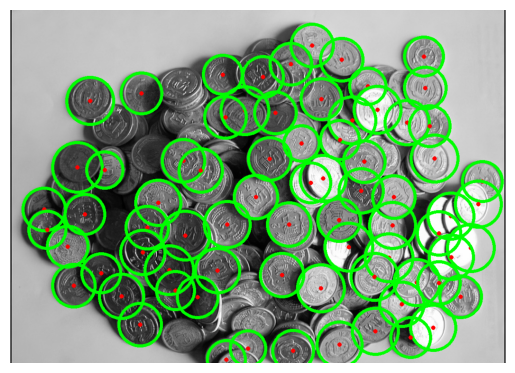

Above circles: min_r40,max_r56
----------------------------------------------------------------------------------------------------
voting threshold:12


filter circle: 953it [00:00, 10510.91it/s]


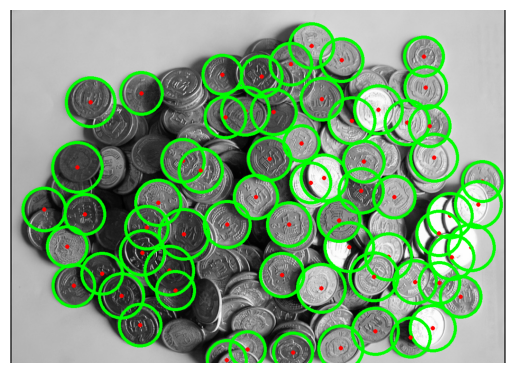

Above circles: min_r40,max_r56
----------------------------------------------------------------------------------------------------
voting threshold:13


filter circle: 669it [00:00, 11900.07it/s]


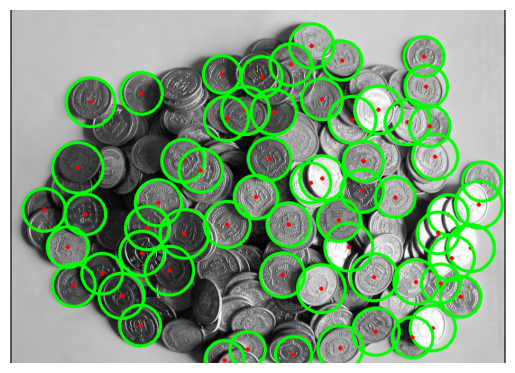

Above circles: min_r40,max_r57
----------------------------------------------------------------------------------------------------
voting threshold:14


filter circle: 458it [00:00, 11818.21it/s]


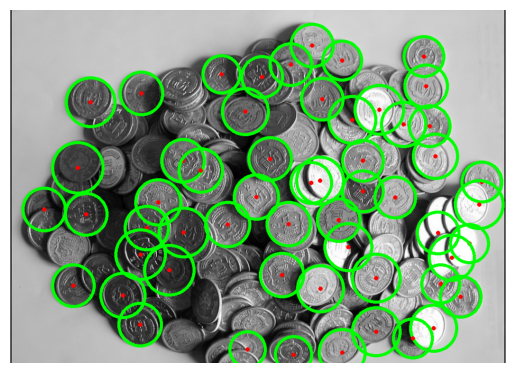

Above circles: min_r40,max_r57
----------------------------------------------------------------------------------------------------
voting threshold:15


filter circle: 323it [00:00, 8351.17it/s]


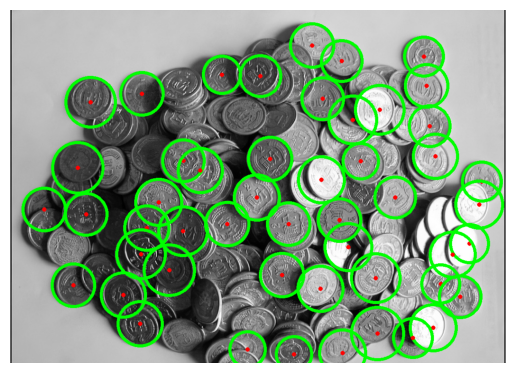

Above circles: min_r40,max_r59
----------------------------------------------------------------------------------------------------
voting threshold:16


filter circle: 228it [00:00, 11092.57it/s]


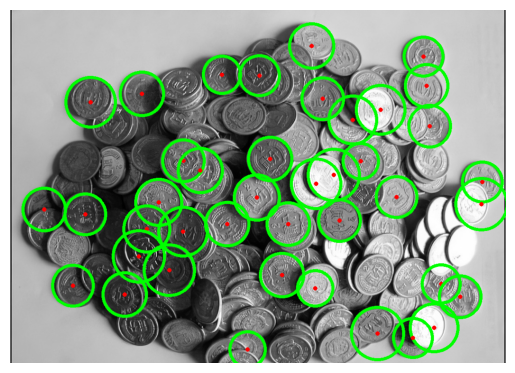

Above circles: min_r40,max_r59
----------------------------------------------------------------------------------------------------
voting threshold:17


filter circle: 161it [00:00, 13370.62it/s]


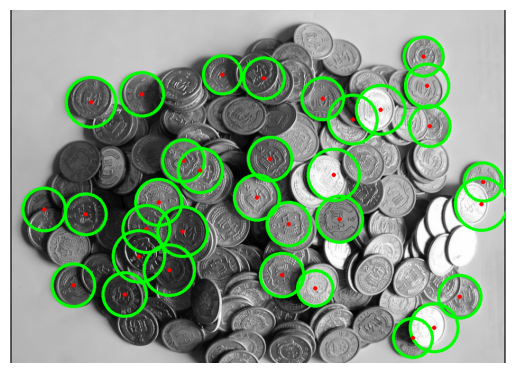

Above circles: min_r40,max_r59
----------------------------------------------------------------------------------------------------
voting threshold:18


filter circle: 113it [00:00, 14945.18it/s]


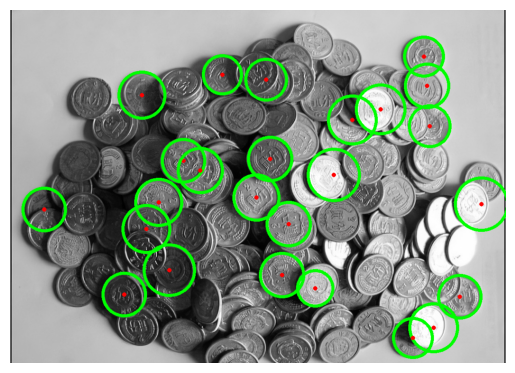

Above circles: min_r40,max_r59
----------------------------------------------------------------------------------------------------
voting threshold:19


filter circle: 89it [00:00, 13404.66it/s]


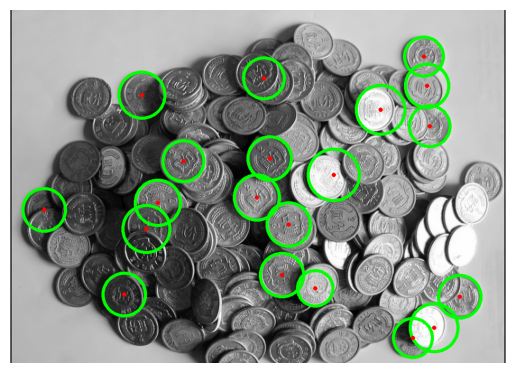

Above circles: min_r40,max_r58
----------------------------------------------------------------------------------------------------
voting threshold:20


filter circle: 61it [00:00, 14110.55it/s]


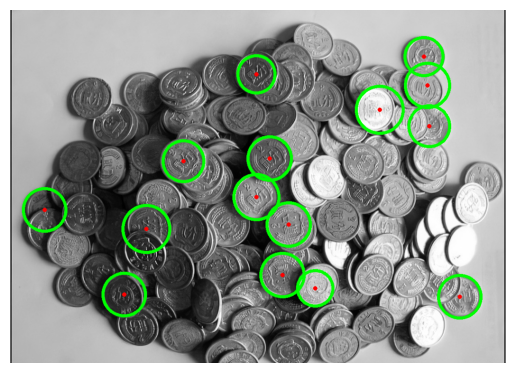

Above circles: min_r40,max_r53
----------------------------------------------------------------------------------------------------
voting threshold:21


filter circle: 49it [00:00, 8578.38it/s]


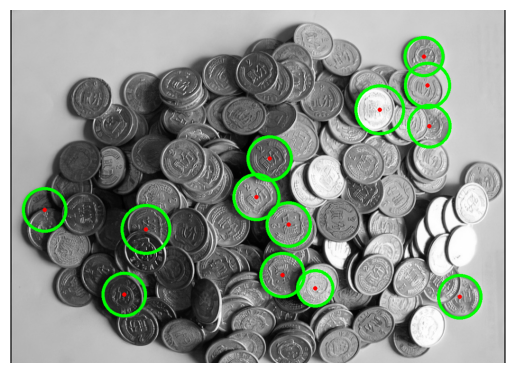

Above circles: min_r40,max_r54
----------------------------------------------------------------------------------------------------
voting threshold:22


filter circle: 39it [00:00, 16382.36it/s]


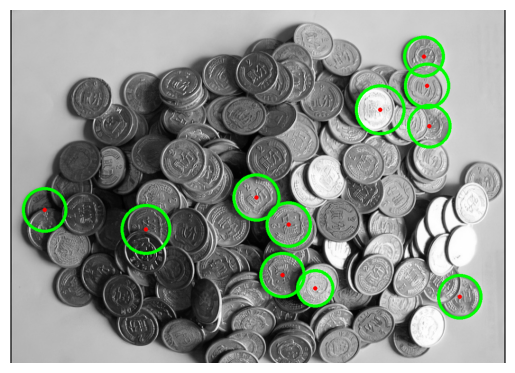

Above circles: min_r40,max_r54
----------------------------------------------------------------------------------------------------
voting threshold:23


filter circle: 35it [00:00, 20104.17it/s]


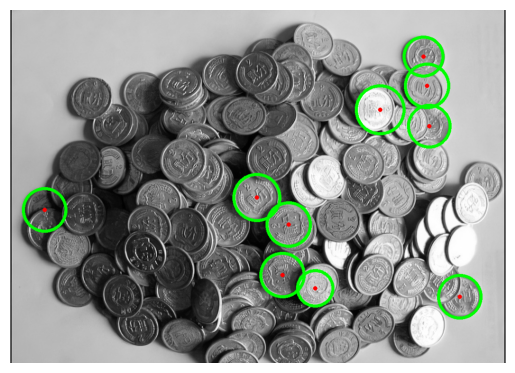

Above circles: min_r40,max_r54
----------------------------------------------------------------------------------------------------
voting threshold:24


filter circle: 26it [00:00, 31104.37it/s]


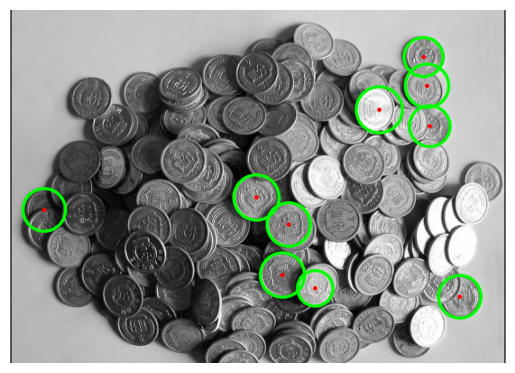

Above circles: min_r40,max_r52
----------------------------------------------------------------------------------------------------
voting threshold:25


filter circle: 17it [00:00, 21252.81it/s]


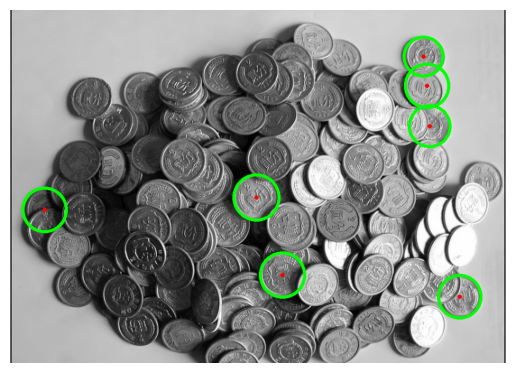

Above circles: min_r44,max_r51
----------------------------------------------------------------------------------------------------
voting threshold:26


filter circle: 14it [00:00, 18396.07it/s]


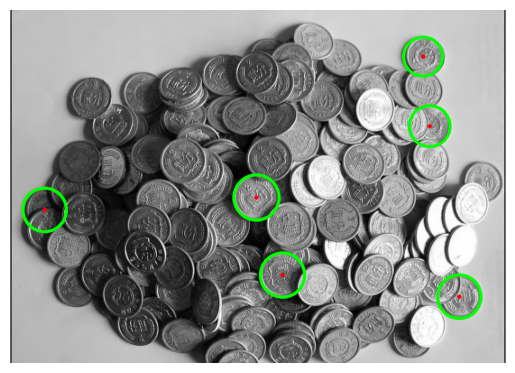

Above circles: min_r44,max_r51
----------------------------------------------------------------------------------------------------
voting threshold:27


filter circle: 11it [00:00, 11736.80it/s]


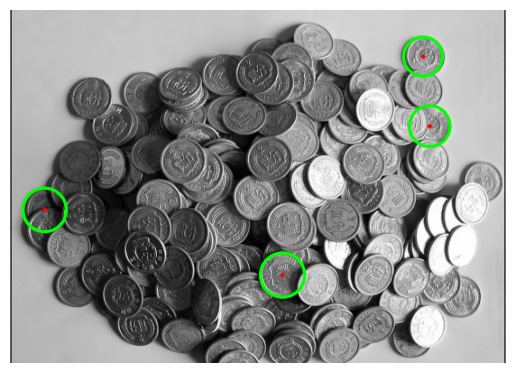

Above circles: min_r44,max_r50
----------------------------------------------------------------------------------------------------
voting threshold:28


filter circle: 6it [00:00, 9386.73it/s]


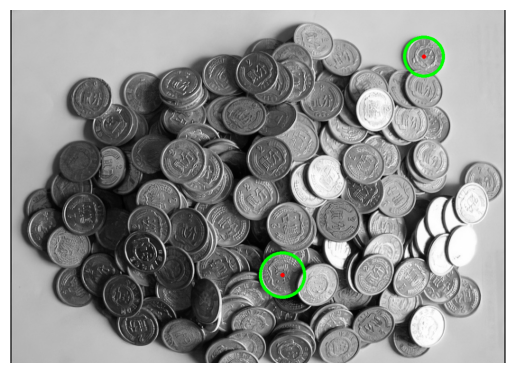

Above circles: min_r44,max_r50
----------------------------------------------------------------------------------------------------
voting threshold:29


filter circle: 6it [00:00, 16567.36it/s]


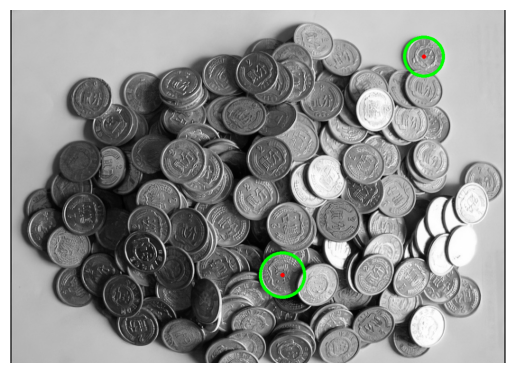

Above circles: min_r44,max_r50
----------------------------------------------------------------------------------------------------
voting threshold:30


filter circle: 4it [00:00, 11096.04it/s]


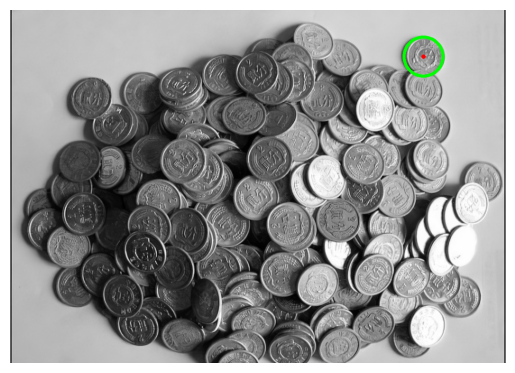

Above circles: min_r44,max_r44
----------------------------------------------------------------------------------------------------
voting threshold:31


filter circle: 4it [00:00, 13606.83it/s]


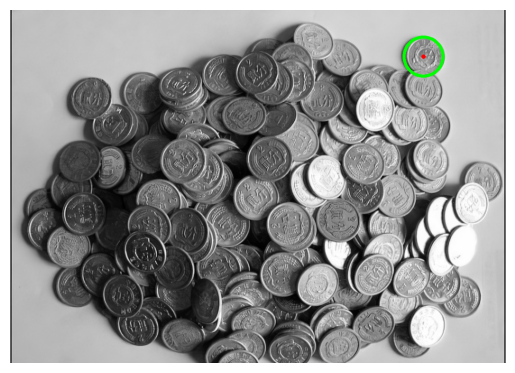

Above circles: min_r44,max_r44
----------------------------------------------------------------------------------------------------
voting threshold:32


filter circle: 4it [00:00, 10070.36it/s]


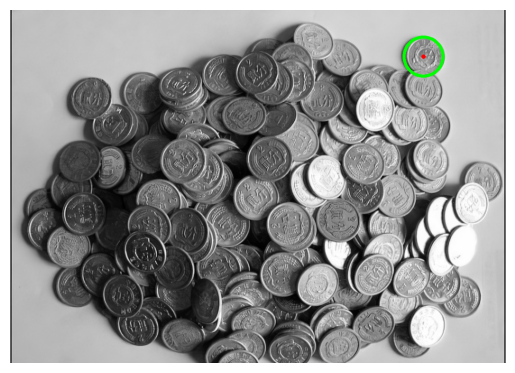

Above circles: min_r44,max_r44
----------------------------------------------------------------------------------------------------
voting threshold:33


filter circle: 3it [00:00, 10556.13it/s]


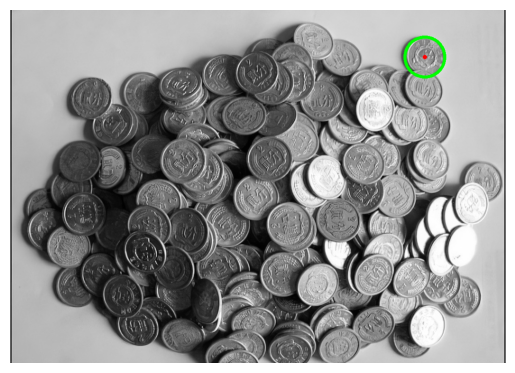

Above circles: min_r45,max_r45
----------------------------------------------------------------------------------------------------
voting threshold:34


filter circle: 3it [00:00, 11814.94it/s]


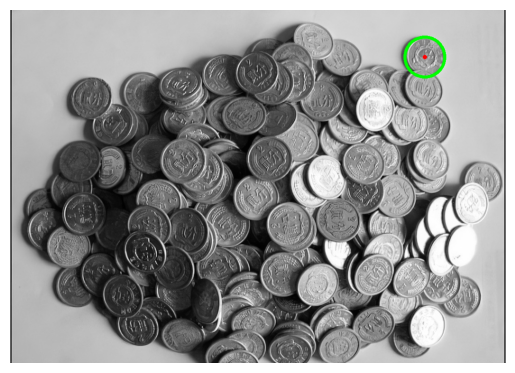

Above circles: min_r45,max_r45
----------------------------------------------------------------------------------------------------
voting threshold:35


filter circle: 3it [00:00, 12409.18it/s]


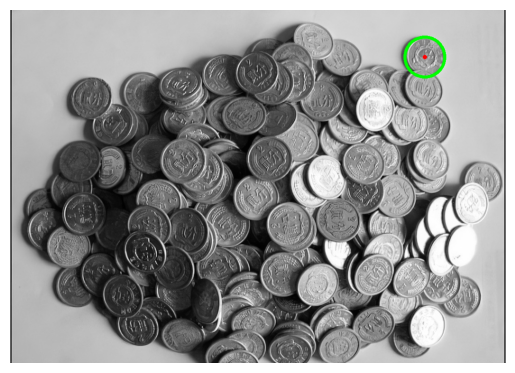

Above circles: min_r45,max_r45
----------------------------------------------------------------------------------------------------
voting threshold:36


filter circle: 3it [00:00, 7384.34it/s]


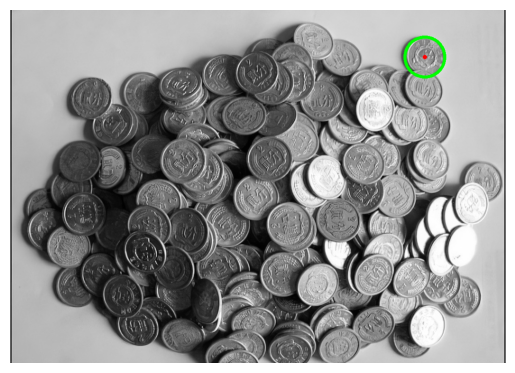

Above circles: min_r45,max_r45
----------------------------------------------------------------------------------------------------
voting threshold:37


filter circle: 3it [00:00, 5352.15it/s]


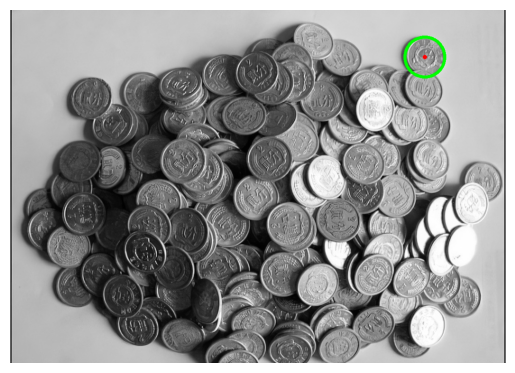

Above circles: min_r45,max_r45
----------------------------------------------------------------------------------------------------
voting threshold:38


filter circle: 3it [00:00, 13472.07it/s]


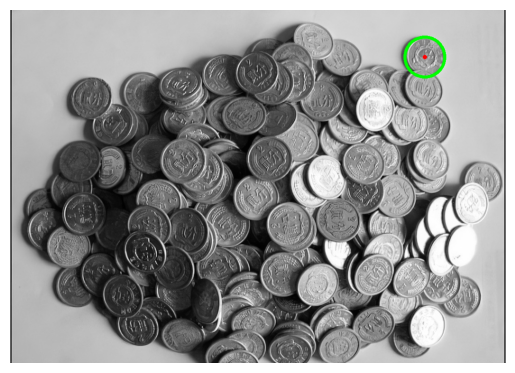

Above circles: min_r45,max_r45
----------------------------------------------------------------------------------------------------
voting threshold:39


filter circle: 2it [00:00, 8924.05it/s]


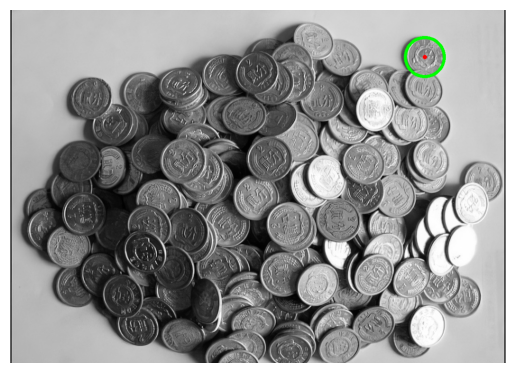

Above circles: min_r44,max_r44
----------------------------------------------------------------------------------------------------
voting threshold:40


filter circle: 1it [00:00, 4165.15it/s]


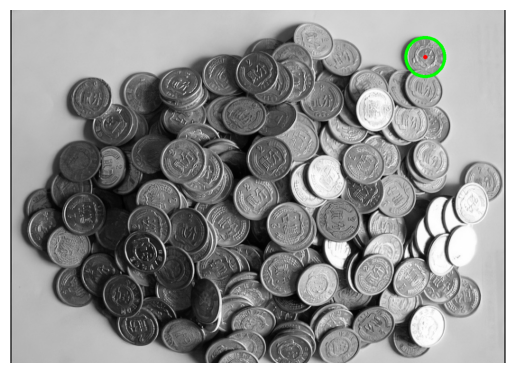

Above circles: min_r44,max_r44
----------------------------------------------------------------------------------------------------
voting threshold:41


filter circle: 1it [00:00, 3840.94it/s]


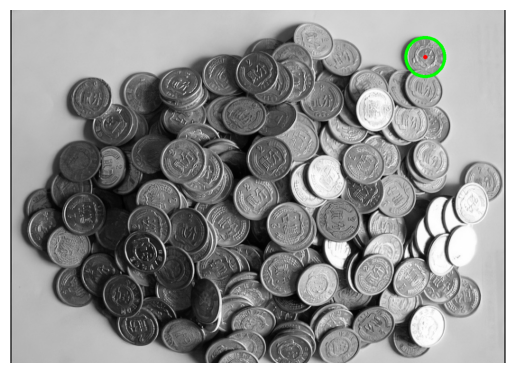

Above circles: min_r44,max_r44
----------------------------------------------------------------------------------------------------


In [9]:
# 针对图片的精调参数
config = {
    "./img/coins2.jpg": {
        "high_threshold": 100,
        "low_threshold": 50,
        "min_r": 50,
        "max_r": 200,
        "min_voting": 17,
        "debugging": False,
        # "vt_debugging": True,
        # "vtd_step": 1,
    },
    "./img/coins3.jpg": {  # 效果相当好的一张图片
        "high_threshold": 100,
        "low_threshold": 50,
        "min_r": 50,
        "max_r": 200,
        "min_voting": 15,
        "debugging": False,
    },
    "./img/coins4.jpg": {
        "high_threshold": 150,
        "low_threshold": 75,
        "min_r": 50,
        "max_r": 200,
        "min_voting": 9,
        "min_center_distance": 50,
        "debugging": False,
        # "vt_debugging": True,
        # "vtd_step": 1,
    },
    "./img/coins5.jpg": {  # 多硬币交叠,调试完成
        "high_threshold": 100,
        "low_threshold": 50,
        "min_r": 30,
        "max_r": 60,
        "min_voting": 8,
        "min_center_distance": 25,
        "debugging": False,
        # "vt_debugging": True,
        # "vtd_step": 1,
    },
    "./img/coins6.jpg": {  # 极大量硬币
        "high_threshold": 70,  # 如果强边缘不够就调整这个值
        "low_threshold": 30,
        "min_r": 40,
        "max_r": 60,
        "min_voting": 10,
        "min_center_distance": 40,
        "debugging": False,
        # "vt_debugging": True,
        # "vtd_step": 1,
    },
}

# 通过更改图片路径使用不同的图片配置
img_path = "./img/coins6.jpg"
# test hough
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
circles = hough_circle(img, **config[img_path])